In [1]:
### libraries for data upload & wrangling

#!pip install -U kaleido
#!pip install folium
#!pip install psycopg2

import pandas as pd
import numpy as np 
import json
import calendar
import datetime as dt
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import plugins
from folium.plugins import MarkerCluster
#import psycopg2

### Load DF, feature inspection, and wrangling

In [3]:
# load the dataframe
df = pd.read_csv("DATA/202209_divvy_distance_weather.csv")

In [4]:
df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,started_at_clean,duration,distance,started_at_unix,temp,hum,windsp,weather,rain,snow
0,2FD3F90EDCE2ACD9,classic_bike,9/1/2022 19:39,9/1/2022 19:46,Southport Ave & Roscoe St,13071,Broadway & Cornelia Ave,13278,41.943739,-87.664020,...,9/1/2022,481.9,1669.2,1662058800,89.89,38,8.05,Clouds,0.0,0
1,EE62794A94F80A83,classic_bike,9/1/2022 6:53,9/1/2022 7:02,LaSalle St & Washington St,13006,Wells St & Polk St,SL-011,41.882664,-87.632530,...,9/1/2022,395.0,1358.8,1662012000,73.96,71,6.91,Clear,0.0,0
2,56FD4B364747F270,electric_bike,9/1/2022 11:25,9/1/2022 11:28,N Sheffield Ave & W Wellington Ave,20256,Southport Ave & Wellington Ave,TA1307000006,41.940000,-87.650000,...,9/1/2022,411.5,1595.7,1662030000,69.58,78,5.75,Clear,0.0,0
3,BD4D6AC842CDF729,classic_bike,9/1/2022 7:46,9/1/2022 8:05,Racine Ave & Wrightwood Ave,TA1309000059,DuSable Lake Shore Dr & North Blvd,LF-005,41.928887,-87.658971,...,9/1/2022,948.8,3643.8,1662015600,73.54,72,6.91,Clear,0.0,0
4,2E0E8C378865C01A,electric_bike,9/1/2022 9:55,9/1/2022 10:12,Wabash Ave & Adams St,KA1503000015,Wood St & Taylor St (Temp),13285,41.879373,-87.625492,...,9/1/2022,1275.1,5104.7,1662022800,70.81,74,6.91,Clear,0.0,0


In [5]:
df.dtypes

ride_id                object
rideable_type          object
started_at             object
ended_at               object
start_station_name     object
start_station_id       object
end_station_name       object
end_station_id         object
start_lat             float64
start_lng             float64
end_lat               float64
end_lng               float64
member_casual          object
started_at_clean       object
duration              float64
distance              float64
started_at_unix         int64
temp                  float64
hum                     int64
windsp                float64
weather                object
rain                  float64
snow                    int64
dtype: object

In [7]:
#rename for predicted time from API call
df.rename(columns = {'duration':'pred_time'}, inplace = True)
print(df['pred_time'])

0          481.9
1          395.0
2          411.5
3          948.8
4         1275.1
           ...  
149995     926.6
149996     914.3
149997     554.2
149998     353.1
149999      19.1
Name: pred_time, Length: 150000, dtype: float64


In [8]:
#look at how datetime is currently
df['started_at'].iloc[0]

'9/1/2022 19:39'

In [9]:
#convert to datetime type
df['started_at'] = pd.to_datetime(df['started_at'])
df['ended_at'] = pd.to_datetime(df['ended_at'])

In [10]:
#validate total_seconds works
(df['ended_at'].iloc[0] - df['started_at'].iloc[0]).total_seconds()

420.0

### wrangle and feature augmentation

In [11]:
#loop thru for seconds diff in actual ride time
result = []
for i in df.index: 
    result.append((df['ended_at'][i] - df['started_at'][i]).total_seconds())
    
df['actual_time'] = result

In [12]:
#loop thru for seconds diff between actual and predicted ride time
diff = []
for i in df.index:
    diff.append((df['actual_time'][i] - df['pred_time'][i]).round(2))
    
df['time_diff'] = diff

In [13]:
#get hour of ride start
start_hours = df['started_at'].dt.hour   
df['start_hour'] = start_hours

In [14]:
#get hour of ride end
end_hours = df['ended_at'].dt.hour
df['end_hour'] = end_hours

In [15]:
#double check
print('actual time:', df['actual_time'][0])
print('predicted time:', df['pred_time'][0])
print('time delta:', df['time_diff'][0])

actual time: 420.0
predicted time: 481.9
time delta: -61.9


In [16]:
#loop thru for day of week feature
result3 = []
for i in df.index:
    result3.append(df['started_at'][i].weekday())

df['day_of_week'] = result3

In [17]:
#convert numerical days to day names

#import calendar
#list(calendar.day_name)

print(calendar.day_abbr[df['day_of_week'][0]])

day_names = []

for i in df.index:
    day_names.append(calendar.day_abbr[df['day_of_week'][i]])
    
df['day_of_week_n'] = day_names

Thu


In [18]:
df.head(5)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,windsp,weather,rain,snow,actual_time,time_diff,start_hour,end_hour,day_of_week,day_of_week_n
0,2FD3F90EDCE2ACD9,classic_bike,2022-09-01 19:39:00,2022-09-01 19:46:00,Southport Ave & Roscoe St,13071,Broadway & Cornelia Ave,13278,41.943739,-87.664020,...,8.05,Clouds,0.0,0,420.0,-61.9,19,19,3,Thu
1,EE62794A94F80A83,classic_bike,2022-09-01 06:53:00,2022-09-01 07:02:00,LaSalle St & Washington St,13006,Wells St & Polk St,SL-011,41.882664,-87.632530,...,6.91,Clear,0.0,0,540.0,145.0,6,7,3,Thu
2,56FD4B364747F270,electric_bike,2022-09-01 11:25:00,2022-09-01 11:28:00,N Sheffield Ave & W Wellington Ave,20256,Southport Ave & Wellington Ave,TA1307000006,41.940000,-87.650000,...,5.75,Clear,0.0,0,180.0,-231.5,11,11,3,Thu
3,BD4D6AC842CDF729,classic_bike,2022-09-01 07:46:00,2022-09-01 08:05:00,Racine Ave & Wrightwood Ave,TA1309000059,DuSable Lake Shore Dr & North Blvd,LF-005,41.928887,-87.658971,...,6.91,Clear,0.0,0,1140.0,191.2,7,8,3,Thu
4,2E0E8C378865C01A,electric_bike,2022-09-01 09:55:00,2022-09-01 10:12:00,Wabash Ave & Adams St,KA1503000015,Wood St & Taylor St (Temp),13285,41.879373,-87.625492,...,6.91,Clear,0.0,0,1020.0,-255.1,9,10,3,Thu


### EDA for human flow

In [19]:
#time range
print('time diff max (in seconds):', df['time_diff'].max())
print('time diff min (in seconds):', df['time_diff'].min())

time diff max (in seconds): 77880.0
time diff min (in seconds): -2097.6


member    88786
casual    61214
Name: member_casual, dtype: int64


<BarContainer object of 2 artists>

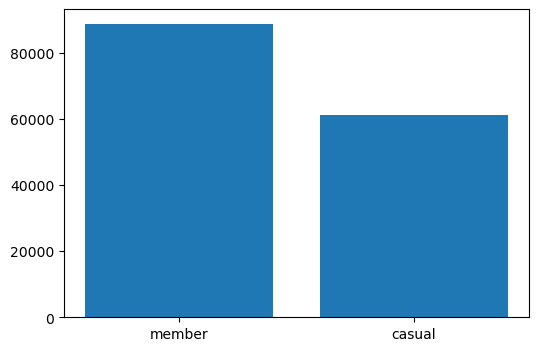

In [20]:
#membership distribution
mem_dist = df['member_casual'].value_counts()
print(mem_dist)
fig, ax = plt.subplots(figsize=(6,4))
plt.bar(('member', 'casual'), mem_dist)
#sns.despine(fig)

### how did Chicago zero out it's own grid?

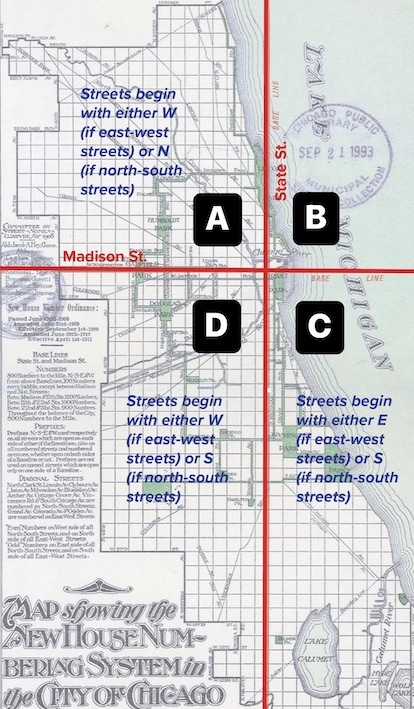

In [21]:
plt.figure(figsize = (15,5))

sns.set_palette("Set1")
sns.scatterplot(data=df, x="start_lat", y="start_lng", size = 3, color='blue').set_title('Latitude & Longitude Distribution')

plt.axvline(41.88206, color='black')
plt.text(41.63,-87.621,'Madison St',rotation=0, color='black')
plt.axhline(-87.62780, color='black')
plt.text(41.85,-87.579,'State St',rotation=0, color='black')

plt.axvline(df['start_lat'].mean(), color='darkred')
plt.text(41.63,-87.66,'Avg Latitude',rotation=0, color='darkred')
plt.axhline(df['start_lng'].mean(), color='darkred')
plt.text(41.906,-87.54,'Avg Longitude',rotation=0, color='darkred')

plt.axvline(df['start_lat'].quantile(q=0.5), color='orange')
plt.text(41.63,-87.64,'50% Quantile Latitude',rotation=0, color='orange')
plt.axhline(df['start_lng'].quantile(q=0.5), color='orange')
plt.text(41.83,-87.54,'50% Quantile Longitude',rotation=0, color='orange')

#plt.show()

plt.savefig('latlngdist.png')

TypeError: Cannot interpret '<attribute 'dtype' of 'numpy.generic' objects>' as a data type

<Figure size 1500x500 with 0 Axes>

In [22]:
#taking a deeper look at avg lats and longs
lat_mean = df['start_lat'].mean()
long_mean = df['start_lng'].mean()

print('lat mean: ', lat_mean , 'long mean: ', long_mean)

lat mean:  41.90268715556035 long mean:  -87.64569122728766


In [23]:
#clockwise quadrant creation (not starting from NW of Madison St & State St), but on mean values
quad = []
#for i in df.index:
for i in range(len(df)):
    if (df['start_lat'][i] >= lat_mean and df['start_lng'][i] <= long_mean):
        quad.append('A')
    elif (df['start_lat'][i] > lat_mean and df['start_lng'][i] > long_mean):
        quad.append('B')
    elif (df['start_lat'][i] < lat_mean and df['start_lng'][i] > long_mean):
        quad.append('C')
    elif (df['start_lat'][i] < lat_mean and df['start_lng'][i] < long_mean):
        quad.append('D')

In [22]:
quad_set = set(quad)

print(len(quad))
print(len(quad_set))
print(quad)

150000
4
['A', 'C', 'A', 'A', 'C', 'C', 'C', 'A', 'D', 'B', 'B', 'A', 'C', 'B', 'A', 'D', 'C', 'C', 'C', 'A', 'A', 'C', 'A', 'C', 'B', 'A', 'A', 'C', 'A', 'A', 'D', 'A', 'B', 'C', 'A', 'B', 'D', 'B', 'A', 'B', 'A', 'C', 'A', 'B', 'B', 'A', 'C', 'A', 'A', 'C', 'A', 'C', 'C', 'C', 'A', 'C', 'A', 'A', 'B', 'A', 'A', 'A', 'C', 'C', 'D', 'C', 'B', 'A', 'C', 'A', 'C', 'C', 'A', 'B', 'C', 'B', 'D', 'A', 'C', 'C', 'A', 'A', 'B', 'C', 'A', 'D', 'C', 'A', 'A', 'A', 'C', 'A', 'A', 'C', 'A', 'A', 'C', 'C', 'C', 'C', 'A', 'B', 'A', 'C', 'C', 'B', 'B', 'C', 'A', 'A', 'C', 'A', 'B', 'B', 'B', 'B', 'A', 'B', 'C', 'D', 'A', 'C', 'A', 'C', 'C', 'C', 'C', 'A', 'C', 'C', 'C', 'C', 'D', 'C', 'C', 'D', 'A', 'D', 'A', 'A', 'C', 'A', 'C', 'A', 'D', 'A', 'A', 'D', 'A', 'D', 'B', 'B', 'A', 'D', 'D', 'D', 'C', 'A', 'A', 'A', 'A', 'A', 'A', 'D', 'C', 'C', 'A', 'D', 'D', 'A', 'A', 'B', 'A', 'D', 'B', 'C', 'A', 'C', 'A', 'C', 'B', 'B', 'C', 'C', 'C', 'D', 'A', 'C', 'B', 'C', 'A', 'B', 'C', 'C', 'D', 'C', 'B', 'D', 

In [24]:
df['quadrant']=quad

In [25]:
df['quadrant'].value_counts()

C    60329
A    49187
D    20492
B    19992
Name: quadrant, dtype: int64

### popular stations

In [26]:
#filter down to just elements for popular stations
popular_stations = df[["ride_id", "start_station_name", "end_station_name", 'quadrant']]
print(list(popular_stations))

['ride_id', 'start_station_name', 'end_station_name', 'quadrant']


In [27]:
#Getting count of popular start stations
pop_start_stations = popular_stations.groupby("start_station_name").size().reset_index(name='counts')

#sort by count, top 10
pop_start_stations.sort_values(by=['counts'], ascending=False)[0:20]

pop_start = pop_start_stations.sort_values(by=['counts'], ascending=False)[0:10]

In [28]:
#Getting count of popular start stations
pop_end_stations = popular_stations.groupby("end_station_name").size().reset_index(name='counts')

#sort by count, top 10
pop_end_stations.sort_values(by=['counts'], ascending=False)[0:20]

,end_station_name,counts
891,Streeter Dr & Grand Ave,2337
530,Michigan Ave & Oak St,1307
942,Wells St & Concord Ln,1191
537,Millennium Park,1168
250,DuSable Lake Shore Dr & North Blvd,1166
249,DuSable Lake Shore Dr & Monroe St,1150
156,Clark St & Elm St,1089
63,Broadway & Barry Ave,1044
491,Loomis St & Lexington St,955
416,Kingsbury St & Kinzie St,946


In [29]:
#popular trips with no loops
routes = (df.groupby(["start_station_name", "end_station_name"]).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
routes.reset_index(drop=True)

,start_station_name,end_station_name,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,371
1,Morgan St & Polk St,Loomis St & Lexington St,225
2,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,202
3,State St & 33rd St,Calumet Ave & 33rd St,196
4,Loomis St & Lexington St,Morgan St & Polk St,194
...,...,...,...
998,Long Ave & Belmont Ave,Meade Ave & Addison St,1
999,Logan Blvd & Elston Ave,Public Rack - St Louis Ave & Berteau Ave,1
1000,Marquette Ave & 89th St,Doty Ave & 111th St,1
1001,Maryland Ave & 104th St,Public Rack - Brainerd Park,1


In [30]:
#popular trips by start/end and day of week
route_dow = (df.groupby(["start_station_name", "end_station_name", 'day_of_week_n']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
route_dow.reset_index(drop=True)

,start_station_name,end_station_name,day_of_week_n,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,Sat,98
1,Morgan St & Polk St,Loomis St & Lexington St,Tue,53
2,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,Sat,53
3,Loomis St & Lexington St,Morgan St & Polk St,Thu,48
4,State St & 33rd St,Calumet Ave & 33rd St,Tue,42
...,...,...,...,...
998,Parkside Ave & Armitage Ave,Public Rack - N Narragansett Ave & Grand Ave,Wed,1
999,Maplewood Ave & Peterson Ave,Public Rack - Sawyer Ave & Bryn Mawr Ave - SW,Mon,1
1000,Martin Luther King Dr & 111th St,Public Rack - King Dr & 115th St,Tue,1
1001,Marquette Ave & 89th St,Doty Ave & 111th St,Wed,1


In [31]:
#popular trips by day of week and membership
route_dow_mem = (df.groupby(["start_station_name", "end_station_name", 'day_of_week_n', 'member_casual']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
route_dow_mem.reset_index(drop=True)


,start_station_name,end_station_name,day_of_week_n,member_casual,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,Sat,casual,94
1,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,Sat,casual,49
2,Morgan St & Polk St,Loomis St & Lexington St,Thu,member,46
3,Loomis St & Lexington St,Morgan St & Polk St,Thu,member,45
4,State St & 33rd St,Calumet Ave & 33rd St,Tue,member,40
...,...,...,...,...,...
998,Public Rack - Nagle Ave & Belmont Ave,Public Rack - Oketo Ave & Belmont Ave,Fri,casual,1
999,Public Rack - Pulaski Rd & 44th St,Christiana Ave & Archer Ave,Sun,member,1
1000,Public Rack - Pulaski Rd & 65th St,Public Rack - Pulaski Rd & 65th St,Thu,member,1
1001,Plainfield & Irving Park,Plainfield & Irving Park,Tue,casual,1


### start hour analytics

In [32]:
#popular trips by start/end and day of week and start hour
route_dow_h = (df.groupby(["start_station_name", "end_station_name", 'day_of_week_n', 'start_hour']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
route_dow_h.reset_index(drop=True)


,start_station_name,end_station_name,day_of_week_n,start_hour,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,Sat,16,15
1,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,Sun,18,12
2,Millennium Park,Millennium Park,Mon,17,9
3,Morgan St & Polk St,Loomis St & Lexington St,Wed,17,8
4,Loomis St & Lexington St,Morgan St & Polk St,Tue,17,8
...,...,...,...,...,...
998,North Ave & New England Ave,Bloomingdale Ave & Harlem Ave,Fri,22,1
999,Oglesby Ave & 100th St,Oglesby Ave & 100th St,Wed,10,1
1000,Nagle Ave & Belmont Ave,Nagle Ave & Belmont Ave,Thu,18,1
1001,Narragansett & Wrightwood,Public Rack - Austin Ave & Wrightwood Ave,Thu,15,1


In [33]:
#popular trips by start/end and day of week, start hour, mem
route_dow_h_mem = (df.groupby(["start_station_name", "end_station_name", 'day_of_week_n', 'start_hour', 'member_casual']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
route_dow_h_mem.reset_index(drop=True)

top100start = route_dow_h_mem[0:100]
top100start

,start_station_name,end_station_name,day_of_week_n,start_hour,member_casual,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,Sat,16,casual,15
4,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,Sun,18,casual,11
8,Streeter Dr & Grand Ave,Millennium Park,Thu,20,casual,8
11,Morgan St & Polk St,Loomis St & Lexington St,Wed,17,member,8
12,Loomis St & Lexington St,Morgan St & Polk St,Thu,13,member,8
...,...,...,...,...,...,...
322,Dearborn St & Monroe St,Dearborn St & Monroe St,Sun,0,casual,4
323,Michigan Ave & Washington St,LaSalle St & Jackson Blvd,Fri,6,member,4
326,Wells St & Huron St,Throop St & Taylor St,Sun,16,casual,4
329,Kedzie Ave & Lake St,Kedzie Ave & Chicago Ave,Sun,8,member,4


In [34]:
#popular trips by start and day of week
start_route_dow = (df.groupby(['start_station_name', 'day_of_week_n']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="start_station_name"))
start_route_dow.reset_index(drop=True)

,start_station_name,day_of_week_n,count
0,Streeter Dr & Grand Ave,Sat,545
1,DuSable Lake Shore Dr & Monroe St,Sat,276
2,DuSable Lake Shore Dr & North Blvd,Sat,275
3,Michigan Ave & Oak St,Sat,240
4,Millennium Park,Sat,219
...,...,...,...
965,Central Park & Augusta Blvd,Wed,1
966,Monticello Ave & Chicago Ave,Sun,1
967,Morgan St & 95th St,Sun,1
968,Nagle Ave & Belmont Ave,Thu,1


In [35]:
start_route_h = (df.groupby(['start_station_name', 'start_hour']).size().sort_values(ascending=False).reset_index(name='count'))
start_route_h.reset_index(drop=True)

start_route_h_20 = start_route_h[0:20]
start_route_h_20

,start_station_name,start_hour,count
0,Streeter Dr & Grand Ave,17,265
1,Streeter Dr & Grand Ave,14,260
2,Streeter Dr & Grand Ave,16,254
3,Streeter Dr & Grand Ave,15,252
4,Streeter Dr & Grand Ave,18,205
5,Streeter Dr & Grand Ave,13,200
6,Streeter Dr & Grand Ave,12,171
7,Clinton St & Washington Blvd,17,167
8,Canal St & Adams St,17,164
9,Michigan Ave & Oak St,16,158


In [36]:
route_start_dow_h = (df.groupby(['start_station_name', 'day_of_week_n', 'start_hour']).size().sort_values(ascending=False).reset_index(name='count'))
route_start_dow_h.reset_index(drop=True)

,start_station_name,day_of_week_n,start_hour,count
0,Streeter Dr & Grand Ave,Sat,14,70
1,Streeter Dr & Grand Ave,Sat,15,64
2,Streeter Dr & Grand Ave,Sat,16,63
3,Streeter Dr & Grand Ave,Sat,13,56
4,Streeter Dr & Grand Ave,Sat,17,56
...,...,...,...,...
47477,Leavitt St & Archer Ave,Sun,18,1
47478,Leavitt St & Archer Ave,Sun,21,1
47479,Leavitt St & Archer Ave,Thu,11,1
47480,Leavitt St & Archer Ave,Thu,15,1


### end hour analytics

In [37]:
#popular trips by end hour
route_dow_eh = (df.groupby(["start_station_name", "end_station_name", 'day_of_week_n', 'end_hour']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset="end_station_name"))
route_dow_eh.reset_index(drop=True)


,start_station_name,end_station_name,day_of_week_n,end_hour,count
0,Streeter Dr & Grand Ave,Streeter Dr & Grand Ave,Sat,18,16
1,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,Sun,18,10
2,Morgan St & Polk St,Loomis St & Lexington St,Fri,12,9
3,Streeter Dr & Grand Ave,Millennium Park,Thu,20,8
4,Loomis St & Lexington St,Morgan St & Polk St,Thu,12,8
...,...,...,...,...,...
998,North Ave & New England Ave,Bloomingdale Ave & Harlem Ave,Fri,22,1
999,Oglesby Ave & 100th St,Oglesby Ave & 100th St,Mon,17,1
1000,Nagle Ave & Belmont Ave,Nagle Ave & Belmont Ave,Thu,19,1
1001,Narragansett & Irving Park,Mulligan Ave & Wellington Ave,Fri,19,1


In [38]:
route_end_eh = (df.groupby(['end_station_name', 'end_hour']).size().sort_values(ascending=False).reset_index(name='count'))
route_end_eh.reset_index(drop=True)

,end_station_name,end_hour,count
0,Streeter Dr & Grand Ave,14,261
1,Streeter Dr & Grand Ave,15,254
2,Streeter Dr & Grand Ave,18,254
3,Streeter Dr & Grand Ave,17,247
4,Streeter Dr & Grand Ave,16,241
...,...,...,...
12417,Kildare Ave & Montrose Ave,7,1
12418,Kildare Ave & 55th St,14,1
12419,Kildare Ave & 55th St,11,1
12420,Kildare Ave & 26th St,15,1


### station analytics

In [39]:
print('start station count:', df['start_station_name'].nunique())
print('end station count:', df['end_station_name'].nunique())

start station count: 970
end station count: 1003


In [40]:
#how many trips started & ended at same station?
len((df.query('start_station_name == end_station_name'))) / len((df.query('start_station_name != end_station_name')))

0.06814783165990174

### time analytics

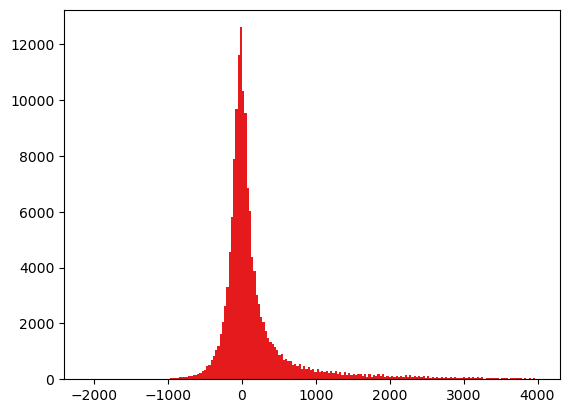

In [41]:
#general hist for time_diff
plt.hist(df['time_diff'], bins = 200, range=[-2100,4000])
plt.show()

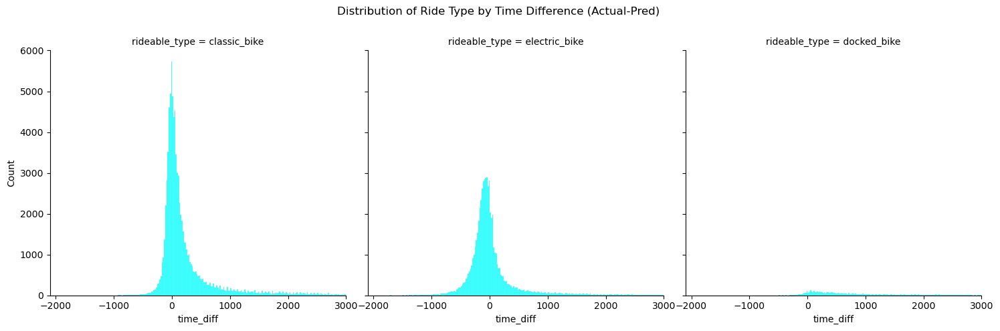

In [42]:
#distributed hist for ride types
ax = sns.displot(df, x='time_diff', col='rideable_type', binwidth=20, color='aqua')
ax.set(xlim=(-2100, 3000))
ax.fig.subplots_adjust(top=0.85) # adjust the Figure in rp
ax.fig.suptitle('Distribution of Ride Type by Time Difference (Actual-Pred)')
plt.savefig('hist_ridetype_ridetime_dist.png')

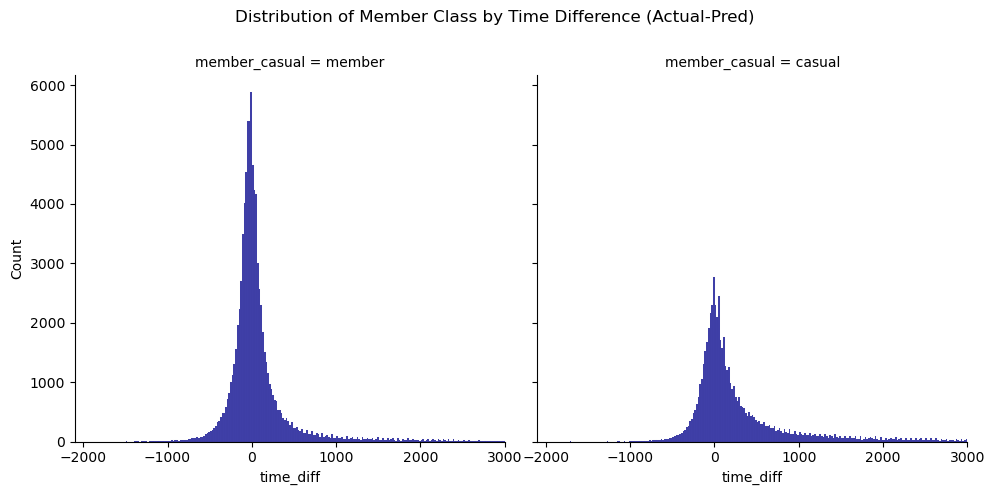

In [43]:
#distributed hist for members vs casual
ax = sns.displot(df, x='time_diff', col='member_casual', binwidth=20, color='darkblue')
ax.set(xlim=(-2100, 3000))
ax.fig.subplots_adjust(top=0.85) # adjust the Figure in rp
ax.fig.suptitle('Distribution of Member Class by Time Difference (Actual-Pred)')
plt.savefig('hist_member_ridetime_dist.png')

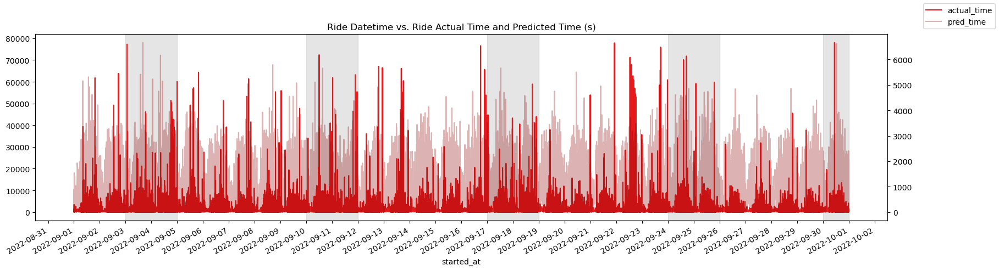

In [44]:
#looking for day variances

from matplotlib import dates

ax = df.plot(x="started_at", y="actual_time", legend=False, figsize=(20,5))
ax2 = ax.twinx()
df.plot(x="started_at", y="pred_time", ax=ax2, legend=False, color="darkred", alpha=0.3).set_title('Ride Datetime vs. Ride Actual Time and Predicted Time (s)')
ax.figure.legend()
ax.xaxis.set_major_locator(dates.DayLocator(interval=1))
#ax.axvline(dt.datetime(2022, 9, 3), color='r')
ax.axvspan('2022-9-3','2022-9-5',color = 'gray', alpha = .2, zorder = -1)
ax.axvspan('2022-9-10','2022-9-12',color = 'gray', alpha = .2, zorder = -1)
ax.axvspan('2022-9-17','2022-9-19',color = 'gray', alpha = .2, zorder = -1)
ax.axvspan('2022-9-24','2022-9-26',color = 'gray', alpha = .2, zorder = -1)
ax.axvspan('2022-9-30','2022-10-01',color = 'gray', alpha = .2, zorder = -1)

#ax.fill_between(dt.datetime(2022, 9, 3), 5, color='blue', alpha=.5)
#plt.show()
plt.savefig('ridetime_dist.png')

#make wider to accomodate all days, add vert line for weekends

<AxesSubplot:>

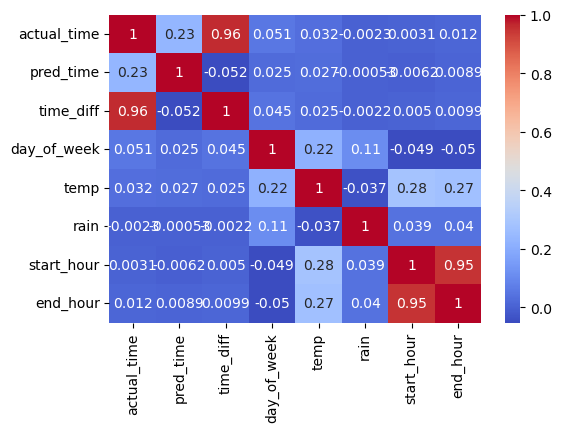

In [45]:
# Create the correlation matrix
trips_cor = df[
    ['actual_time',
    'pred_time',
    'time_diff',
    'start_station_name',
    'end_station_name',
    'day_of_week',
    'temp',
    'rain',
    'rideable_type',
    'member_casual',
    'start_hour',
    'end_hour',
    'quadrant'
    ]
  ]
corrMatrix = trips_cor.corr()
plt.figure(figsize=(6, 4))
sns.heatmap(corrMatrix, annot=True, cmap="coolwarm")

In [46]:
df_compareTrip = df.groupby(['rideable_type','member_casual','day_of_week_n'], as_index=False).agg({'actual_time':'mean'})
#df_compareTrip

In [47]:
fig_tripduration = px.sunburst(df_compareTrip, path = ['member_casual', 'rideable_type', 'day_of_week_n'], 
                        values = 'actual_time',
                        color = 'actual_time',
                        color_continuous_scale = 'blues',
                        maxdepth = -1)
                        #title = 'Actual Ride Time across Member Class, Ride Type, and Day of Week')

fig_tripduration.update_layout(margin = dict(t = 10, b = 10, r = 10, l = 10),
                                showlegend = False,
                                plot_bgcolor = 'black',
                                )
                  
fig_tripduration.show()

fig_tripduration.write_image('member_ridetype_dow.png')
#plt.savefig('member_ridetype_dow.png') #bbox_inches='tight')

AttributeError: type object 'object' has no attribute 'dtype'

In [48]:
#top 100 start routes sunburst chart
fig_tripduration = px.sunburst(top100start, path = ['member_casual', 'start_station_name', 'day_of_week_n'], 
                        values = 'count',
                        color = 'count',
                        color_continuous_scale = 'reds',
                        maxdepth = -1)

fig_tripduration.update_layout(margin = dict(t = 10, b = 10, r = 10, l = 10),
                                showlegend = False,
                                plot_bgcolor = 'black',
                                )
                  
fig_tripduration.show()
fig_tripduration.write_image('burst_member_ride_day.png')

AttributeError: type object 'object' has no attribute 'dtype'

In [49]:
fig_tripduration = px.sunburst(df, path = ['quadrant','start_hour'], 
                        values = 'actual_time',
                        color = 'actual_time',
                        color_continuous_scale = 'blues',
                        maxdepth = -1)

fig_tripduration.update_layout(margin = dict(t = 10, b = 10, r = 10, l = 10),
                                showlegend = False,
                                plot_bgcolor = 'black',
                                )
                  
fig_tripduration.show()

fig_tripduration.write_image('burst_quadrant_hour.png')

AttributeError: type object 'object' has no attribute 'dtype'

In [ ]:
fig_tripduration = px.sunburst(df, path = ['quadrant','start_station_name'], 
                        values = 'actual_time',
                        color = 'actual_time',
                        color_continuous_scale = 'greens',
                        maxdepth = -1)

fig_tripduration.update_layout(margin = dict(t = 10, b = 10, r = 10, l = 10),
                                showlegend = False,
                                plot_bgcolor = 'black',
                                )
                  
fig_tripduration.show()
fig_tripduration.write_image('burst_quadrant_station.png')

In [50]:
fig_tripduration = px.sunburst(df, path = ['quadrant','day_of_week_n'], 
                        values = 'actual_time',
                        color = 'actual_time',
                        color_continuous_scale = 'oranges',
                        maxdepth = -1)

fig_tripduration.update_layout(margin = dict(t = 10, b = 10, r = 10, l = 10),
                                showlegend = False,
                                plot_bgcolor = 'black',
                                )
                  
fig_tripduration.show()
fig_tripduration.write_image('burst_quadrant_day.png')

In [50]:
fig = px.scatter(df, x = 'day_of_week_n', y = 'time_diff', color = 'day_of_week_n', facet_col = 'member_casual', facet_row = 'quadrant', width = 800, height = 1200)
fig.update_layout(title = {"text": "hour vs. time", "x": 0.5,}, title_font_color = 'blue', showlegend = False,) #plot_bgcolor = 'black',
fig.update_xaxes(tickmode = 'auto', showgrid = False) #tickmode = 'linear'
fig.update_yaxes(showgrid = True)
fig.show()

In [52]:
#hour display count for station below:
sgh = df[df['start_station_name']=='Streeter Dr & Grand Ave'].groupby(df['start_hour']).size().reset_index(name=' Streeter&Grand count')
sgh

,start_hour,Streeter&Grand count
0,0,11
1,1,2
2,2,8
3,3,2
4,5,1
5,6,9
6,7,27
7,8,40
8,9,57
9,10,76


In [51]:
### trying to get 24 hour counts for each hour, for each station
#print(start_route_h_20)

stationhdist = []
main_df = []

for station in df['start_station_name'][0:5]:
    stationhdist.append(df[df['start_station_name']==station].groupby(df['start_hour']).size().reset_index(name='{} hour count'.format(station)))

#stationhdist = pd.DataFrame(stationhdist)
#print(stationhdist)
stationdist = pd.concat(stationhdist)
stationdist[10:30]



,start_hour,Southport Ave & Roscoe St hour count,LaSalle St & Washington St hour count,N Sheffield Ave & W Wellington Ave hour count,Racine Ave & Wrightwood Ave hour count,Wabash Ave & Adams St hour count
10,11,39.0,NaN,NaN,NaN,NaN
11,12,44.0,NaN,NaN,NaN,NaN
12,13,37.0,NaN,NaN,NaN,NaN
13,14,43.0,NaN,NaN,NaN,NaN
14,15,50.0,NaN,NaN,NaN,NaN
15,16,42.0,NaN,NaN,NaN,NaN
16,17,68.0,NaN,NaN,NaN,NaN
17,18,68.0,NaN,NaN,NaN,NaN
18,19,51.0,NaN,NaN,NaN,NaN
19,20,28.0,NaN,NaN,NaN,NaN


In [54]:
#bucketize lat/longs by quadrant, and by day of week

#quadrant by time of day


In [55]:
#sns.swarmplot(x="Age", data=df, size = 4.5)

In [56]:
###wtf won't this run!! lol
#figure, ax = plt.subplots(figsize = (15,5))
#sns.set_palette("Set2")
#sns.swarmplot(x="quadrant", y="actual_time",
             # data=df[0:1000], size = 1.5, ax = ax).set_title('quadrant vs. actual time')

In [52]:
#folium map for ride start/stop
ride_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)

marker_cluster = MarkerCluster().add_to(ride_map)

for (lat,lng, id) in zip(df['start_lat'][0:1000], df['start_lng'][0:1000], df['ride_id'][0:1000]):
    folium.Marker(location=(lat,lng),popup=
                    folium.Popup(html="lat: %s <br> long: %s<br> ride iD: %s"
                    %(lat,lng, id)),icon=folium.Icon(color='green',
                    icon='ok-sign'),).add_to(marker_cluster)

for (lat,lng, id) in zip(df['end_lat'][0:1000], df['end_lng'][0:1000], df['ride_id'][0:1000]):
    folium.Marker(location=(lat,lng),popup=
                    folium.Popup(html="lat: %s <br> long: %s <br> ride iD: %s"
                    %(lat,lng, id)),icon=folium.Icon(color='red',
                    icon='remove-sign'),).add_to(marker_cluster)

# for (points, id) in zip(df['start_lat'][0:1000], df['start_lng'][0:1000], df['end_lat'][0:1000], df['end_lng'][0:1000], df['ride_id'][0:1000]):
#folium.Marker(points, color="red", weight=2.5, opacity=1).add_to(ride_map)
    
ride_map

In [53]:
#you can identify some high traffic areas, despite this being 'as the crow flies'

start_latlng = list(zip(df['start_lat'], df['start_lng']))
end_latlng = list(zip(df['end_lat'], df['end_lng']))

points=list(zip(start_latlng, end_latlng))
points

folium.PolyLine(points[0:1000], color="red", weight=1.5, opacity=0.7).add_to(ride_map)
ride_map

### modeling

In [59]:
df.isna().sum()

ride_id               0
rideable_type         0
started_at            0
ended_at              0
start_station_name    0
start_station_id      0
end_station_name      0
end_station_id        0
start_lat             0
start_lng             0
end_lat               0
end_lng               0
member_casual         0
started_at_clean      0
pred_time             0
distance (m)          0
started_at_unix       0
temp                  0
hum                   0
windsp                0
weather               0
rain                  0
snow                  0
actual_time           0
time_diff             0
start_hour            0
end_hour              0
day_of_week           0
day_of_week_n         0
quadrant              0
dtype: int64

In [60]:
dfML = df[['rideable_type', 'member_casual', 'pred_time', 'temp', 'actual_time', 'time_diff', 'quadrant', 'start_hour', 'end_hour', 'day_of_week_n']].copy()
#dfML = df['rideable_type']

In [61]:
### one hot encoding

rt_dummies = pd.get_dummies(dfML['rideable_type'])
mc_dummies = pd.get_dummies(dfML['member_casual'])
q_dummies = pd.get_dummies(dfML['quadrant'])
wd_dummies = pd.get_dummies(dfML['day_of_week_n'])

#combine and drop originals
dfML = pd.concat([dfML, rt_dummies, mc_dummies, q_dummies, wd_dummies], axis=1)

dfML = dfML.drop(columns = ['rideable_type', 'member_casual', 'quadrant', 'day_of_week_n'])


In [62]:
dfML.head()

,pred_time,temp,actual_time,time_diff,start_hour,end_hour,classic_bike,docked_bike,electric_bike,casual,...,B,C,D,Fri,Mon,Sat,Sun,Thu,Tue,Wed
0,481.9,89.89,450.0,-31.9,19,19,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,395.0,73.96,553.0,158.0,6,7,1,0,0,1,...,0,1,0,0,0,0,0,1,0,0
2,411.5,69.58,192.0,-219.5,11,11,0,0,1,1,...,0,0,0,0,0,0,0,1,0,0
3,948.8,73.54,1173.0,224.2,7,8,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
4,1275.1,70.81,1016.0,-259.1,9,10,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0


In [66]:
from sklearn.model_selection import train_test_split
y = dfML['actual_time']
X = dfML.drop(['actual_time'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=30)

In [67]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [68]:
### out of RAM
clf = RandomForestClassifier(n_estimators = 10, random_state = 10)
rf_train = clf.fit(X_train,y_train)

In [69]:
y_pred = clf.predict(X_test)

In [70]:
clf.predict_proba(X)[0:5]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [71]:
importance = list(zip(X, clf.feature_importances_))
importance

[('pred_time', 0.23152149262099778),
 ('temp', 0.16034745810293213),
 ('time_diff', 0.24328707650090461),
 ('start_hour', 0.10087115677606091),
 ('end_hour', 0.10655207672419517),
 ('classic_bike', 0.008754164466099376),
 ('docked_bike', 0.0016062627782293484),
 ('electric_bike', 0.008656986904981411),
 ('casual', 0.005058824936961431),
 ('member', 0.005062274191494392),
 ('A', 0.014394273833201252),
 ('B', 0.01070016449636039),
 ('C', 0.014888428016588401),
 ('D', 0.009205724531028683),
 ('Fri', 0.013175785713300973),
 ('Mon', 0.010914973470174155),
 ('Sat', 0.008446998033966617),
 ('Sun', 0.011195592361439377),
 ('Thu', 0.012769238299458868),
 ('Tue', 0.011345278477781547),
 ('Wed', 0.011245768763843119)]

In [72]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

        -4.0       0.00      0.00      0.00         1
         0.0       0.00      0.00      0.00         2
         1.0       0.00      0.00      0.00         2
         2.0       0.28      0.61      0.38        36
         3.0       0.20      0.31      0.24        39
         4.0       0.10      0.21      0.14        24
         5.0       0.00      0.00      0.00        21
         6.0       0.17      0.22      0.19        18
         7.0       0.04      0.11      0.06         9
         8.0       0.03      0.07      0.05        15
         9.0       0.11      0.18      0.13        17
        10.0       0.12      0.27      0.16        15
        11.0       0.05      0.09      0.07        11
        12.0       0.11      0.11      0.11        18
        13.0       0.07      0.10      0.08        20
        14.0       0.00      0.00      0.00        14
        15.0       0.08      0.12      0.10        17
        16.0       0.06    

/Users/thecg11/Applications/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/thecg11/Applications/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/Users/thecg11/Applications/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/thecg11/Applications/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-scor

In [73]:
accuracy = (metrics.accuracy_score(y_test, y_pred)) * 100
accuracy

0.7266666666666667